In [1]:
import torch

if torch.cuda.is_available():
    gpu_name = torch.cuda.get_device_name(0)
    print(f"GPU is available: {gpu_name}")
else:
    print("No GPU is available.")

GPU is available: Quadro RTX 5000


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

## Neural Radiance Field
#### Final Project, Ryan Nader, CS180

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


### Part 1: Fit a Neural Field to a 2D Image

So here we have the Image $\in \mathbb{R}^{H \times W \times C}$
- $H$ : Image height (number of rows of pixels).
- $W$ : Image width (number of columns of pixels).
- $C$ : Number of color channels (3 for RGB: red, green, blue).

We normalize the pixel values to $[0,1]$ to make them suitable for the neural network.

In [4]:
def load_image(image_path):
    image = Image.open(image_path).convert("RGB")
    image_np = np.array(image) / 255.0
    H, W, C = image_np.shape
    coords = np.array([[x, y] for y in range(H) for x in range(W)])
    colors = image_np.reshape(-1, C)
    coords = torch.tensor(coords, dtype=torch.float32, device=device)
    colors = torch.tensor(colors, dtype=torch.float32, device=device)
    return coords, colors, H, W, C

#### Positional Encoding
The network needs to learn fine details in the image. Positional encoding (PE) helps by transforming the input coordinates into a higher-dimensional space. The encoding is defined as: $P E(x)=\left\{x, \sin \left(2^0 \pi x\right), \cos \left(2^0 \pi x\right), \sin \left(2^1 \pi x\right), \cos \left(2^1 \pi x\right), \ldots, \sin \left(2^{L-1} \pi x\right), \cos \left(2^{L-1} \pi x\right)\right\}$

- $x$ : Input coordinate (e.g., pixel position $(u, v)$ ).
- $L$ : Number of frequency levels (e.g., $L=10$ ).
- The sine and cosine terms capture both low-frequency and high-frequency variations in the input.

This encoding transforms a 2D input $((u, v))$ into a $2+2 L$-dimensional vector.

In [5]:
class PositionalEncoding(nn.Module):
    def __init__(self, input_dims, num_frequencies):
        super(PositionalEncoding, self).__init__()
        self.num_frequencies = num_frequencies
        self.freq_bands = 2.0 ** torch.arange(0, num_frequencies, dtype=torch.float32, device=device)
    
    def forward(self, x):
        x_expanded = [x]
        for freq in self.freq_bands:
            x_expanded.append(torch.sin(freq * x))
            x_expanded.append(torch.cos(freq * x))
        return torch.cat(x_expanded, dim=-1)

#### Neural Network (MLP)
An MLP (Multilayer Perceptron) is a simple neural network composed of layers: $f(x)=W_n \sigma\left(W_{n-1} \sigma\left(\ldots \sigma\left(W_1 x+b_1\right) \ldots\right)+b_{n-1}\right)+b_n$

- $x$ : Input (in this case, positional encoding of pixel coordinates).
- $W_i, b_i$ : Weights and biases for layer $i$.
- $\sigma$ : Activation function (ReLU is common for hidden layers, Sigmoid for output).

The last layer outputs RGB values $[r, g, b]$ for each pixel coordinate.

In [6]:
class NeuralField(nn.Module):
    def __init__(self, input_dims, hidden_dims, output_dims, num_frequencies):
        super(NeuralField, self).__init__()
        self.positional_encoding = PositionalEncoding(input_dims, num_frequencies)
        input_dims_encoded = input_dims * (2 * num_frequencies + 1)
        self.network = nn.Sequential(
            nn.Linear(input_dims_encoded, hidden_dims),
            nn.ReLU(),
            nn.Linear(hidden_dims, hidden_dims),
            nn.ReLU(),
            nn.Linear(hidden_dims, output_dims),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        x_encoded = self.positional_encoding(x)
        return self.network(x_encoded)

#### Training this model
Training involves minimizing the difference between predicted and actual pixel colors using a loss function: Loss $=\frac{1}{N} \sum_{i=1}^N\left\|\hat{y}_i-y_i\right\|^2$
- $\hat{y}_i$ : Predicted color for pixel $i$.
- $y_i$ : Actual color for pixel $i$.
- $N$ : Number of pixels in a batch.

We use Adam optimizer to adjust the weights and biases during training.
#### Visualize
After training, we use the network to predict the RGB values for all pixel coordinates. The network’s ability to reconstruct the image shows how well it learned the mapping.

In [7]:
def report_model_details(hidden_dims, num_frequencies, learning_rate):
    return f"Model Summary:\nHidden Dimensions: {hidden_dims}\nMax Frequency: {num_frequencies}\nLearning Rate: {learning_rate}"

def hyperparameter_tuning(coords, colors, H, W, C, hidden_layer_options, frequency_options, learning_rates, num_iterations, batch_size):
    results = []

    for hidden_dims in hidden_layer_options:
        for num_frequencies in frequency_options:
            for learning_rate in learning_rates:
                print(f"Training with HD:{hidden_dims}, Freq:{num_frequencies}, LR:{learning_rate}")
                model = NeuralField(2, hidden_dims, 3, num_frequencies).to(device)
                model_summary = report_model_details(hidden_dims, num_frequencies, learning_rate)

                loss_fn = nn.MSELoss()
                optimizer = optim.Adam(model.parameters(), lr=learning_rate)

                psnr_values = []
                loss_values = []
                iterations = []
                reconstructed_images = []

                with tqdm(total=num_iterations, desc=f"HD:{hidden_dims}, Freq:{num_frequencies}, LR:{learning_rate}", unit="iteration") as pbar:
                    for iteration in range(num_iterations):
                        indices = torch.randint(0, coords.size(0), (batch_size,), device=device)
                        batch_coords = coords[indices]
                        batch_colors = colors[indices]

                        normalized_coords = batch_coords / torch.tensor([W, H], device=device)
                        predicted_colors = model(normalized_coords)
                        loss = loss_fn(predicted_colors, batch_colors)

                        psnr = 10 * torch.log10(1 / loss)

                        optimizer.zero_grad()
                        loss.backward()
                        optimizer.step()

                        psnr_values.append(psnr.item())
                        loss_values.append(loss.item())
                        iterations.append(iteration)

                        if iteration % 200 == 0:
                            with torch.no_grad():
                                all_coords = coords / torch.tensor([W, H], device=device)
                                reconstructed_image = model(all_coords).cpu().numpy().reshape(H, W, C)
                                reconstructed_images.append((iteration, reconstructed_image))

                            pbar.set_postfix({"Loss": f"{loss.item():.6f}", "PSNR": f"{psnr.item():.2f}"})
                        pbar.update(1)

                results.append({
                    "hidden_dims": hidden_dims,
                    "num_frequencies": num_frequencies,
                    "learning_rate": learning_rate,
                    "iterations": iterations,
                    "psnr_values": psnr_values,
                    "loss_values": loss_values,
                    "reconstructed_images": reconstructed_images,
                    "model_summary": model_summary,
                    "final_loss": loss_values[-1],
                    "final_psnr": psnr_values[-1]
                })
    return results


def plot_hyperparameter_results(results):
    plt.figure(figsize=(12, 6))
    for result in results:
        plt.plot(result["iterations"], result["psnr_values"], label=f"HD:{result['hidden_dims']}, Freq:{result['num_frequencies']}, LR:{result['learning_rate']}")
    plt.xlabel("Iterations")
    plt.ylabel("PSNR (dB)")
    plt.title("PSNR Curves for Hyperparameter Combinations")
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    for result in results:
        plt.plot(result["iterations"], result["loss_values"], label=f"HD:{result['hidden_dims']}, Freq:{result['num_frequencies']}, LR:{result['learning_rate']}")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.title("Loss Curves for Hyperparameter Combinations")
    plt.legend()
    plt.show()

def visualize_reconstructed_images(results):
    for result in results:
        hidden_dims = result["hidden_dims"]
        num_frequencies = result["num_frequencies"]
        reconstructed_images = result["reconstructed_images"]
        model_summary = result["model_summary"]
        final_loss = result["final_loss"]

        fig, axes = plt.subplots(1, len(reconstructed_images), figsize=(20, 5))
        for i, (iteration, img) in enumerate(reconstructed_images):
            axes[i].imshow(img)
            axes[i].axis("off")
            axes[i].set_title(f"Iter:{iteration}\nPSNR:{result['psnr_values'][i*200]:.2f}\nLoss:{result['loss_values'][i*200]:.4f}")

        plt.suptitle(f"{model_summary}\nFinal Loss: {final_loss:.6f}", fontsize=10)
        plt.tight_layout()
        plt.show()
        
def display_best_result(results):
    best_result = max(results, key=lambda x: x["final_psnr"])
    best_image = best_result["reconstructed_images"][-1][1]
    best_metadata = f"{best_result['model_summary']}\nFinal Loss: {best_result['final_loss']:.6f}\nFinal PSNR: {best_result['final_psnr']:.2f} dB"

    plt.figure(figsize=(8, 8))
    plt.imshow(best_image)
    plt.axis("off")
    plt.title(f"Best Result\n{best_metadata}", fontsize=10)
    plt.show()

### Deliverables
[Deliverables] As a reference, the above images show the process of optimizing the network to fit on this image.
- Report the detailed architecture of your model. Include information on hyperparameters chosen for training and a plot showing the training PSNR across iterations.
- Visualize the training process by plotting the predicted images across iterations, similar to the above reference.
- Try running this optimization on at least another image from your collection. Choose one set of hyperparameter for this image and show the PNSR curve, as well as the visualization of the training process.
- Run the aforementioned hyperparameter tuning.

### Main Loop

#### image1

Training with HD:64, Freq:5, LR:0.01


HD:64, Freq:5, LR:0.01: 100%|█| 3001/3001 [00:05<00:00, 586.04iteration/s, Loss=


Training with HD:64, Freq:5, LR:0.005


HD:64, Freq:5, LR:0.005: 100%|█| 3001/3001 [00:04<00:00, 615.13iteration/s, Loss


Training with HD:64, Freq:10, LR:0.01


HD:64, Freq:10, LR:0.01: 100%|█| 3001/3001 [00:05<00:00, 537.89iteration/s, Loss


Training with HD:64, Freq:10, LR:0.005


HD:64, Freq:10, LR:0.005: 100%|█| 3001/3001 [00:05<00:00, 535.62iteration/s, Los


Training with HD:64, Freq:50, LR:0.01


HD:64, Freq:50, LR:0.01: 100%|█| 3001/3001 [00:10<00:00, 281.30iteration/s, Loss


Training with HD:64, Freq:50, LR:0.005


HD:64, Freq:50, LR:0.005: 100%|█| 3001/3001 [00:10<00:00, 282.18iteration/s, Los


Training with HD:128, Freq:5, LR:0.01


HD:128, Freq:5, LR:0.01: 100%|█| 3001/3001 [00:05<00:00, 598.65iteration/s, Loss


Training with HD:128, Freq:5, LR:0.005


HD:128, Freq:5, LR:0.005: 100%|█| 3001/3001 [00:04<00:00, 608.36iteration/s, Los


Training with HD:128, Freq:10, LR:0.01


HD:128, Freq:10, LR:0.01: 100%|█| 3001/3001 [00:05<00:00, 531.60iteration/s, Los


Training with HD:128, Freq:10, LR:0.005


HD:128, Freq:10, LR:0.005: 100%|█| 3001/3001 [00:05<00:00, 529.05iteration/s, Lo


Training with HD:128, Freq:50, LR:0.01


HD:128, Freq:50, LR:0.01: 100%|█| 3001/3001 [00:10<00:00, 281.03iteration/s, Los


Training with HD:128, Freq:50, LR:0.005


HD:128, Freq:50, LR:0.005: 100%|█| 3001/3001 [00:10<00:00, 279.83iteration/s, Lo


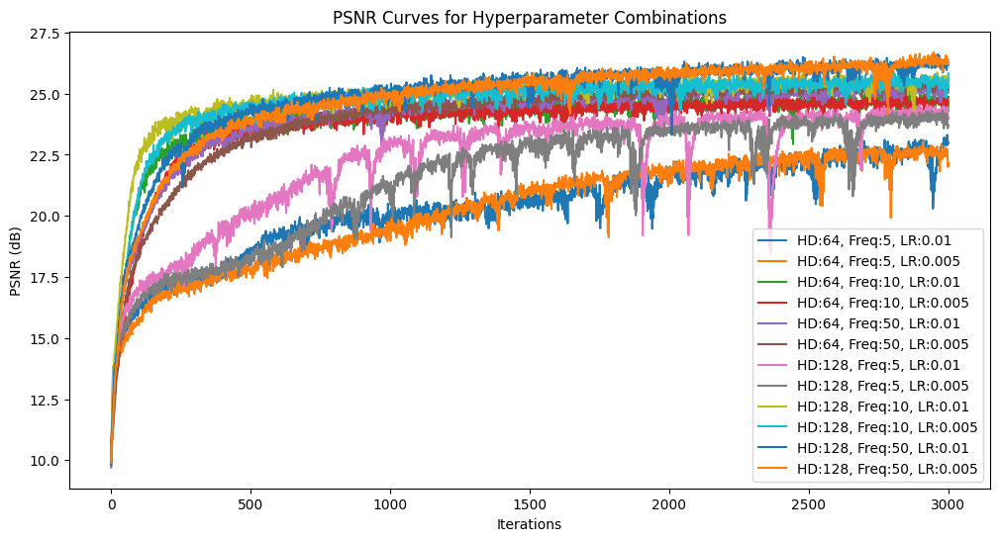

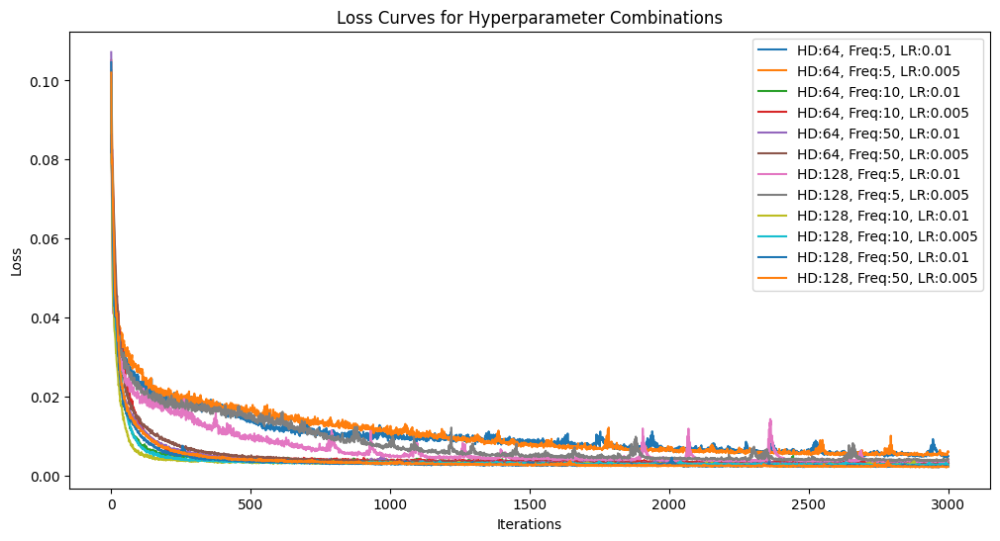

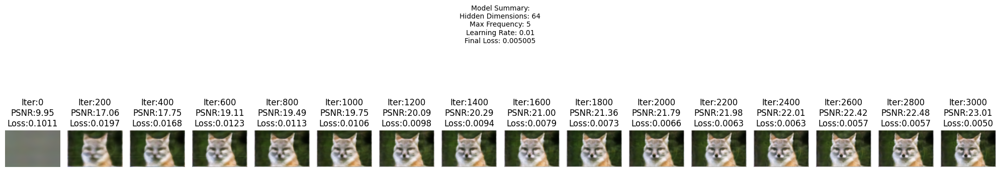

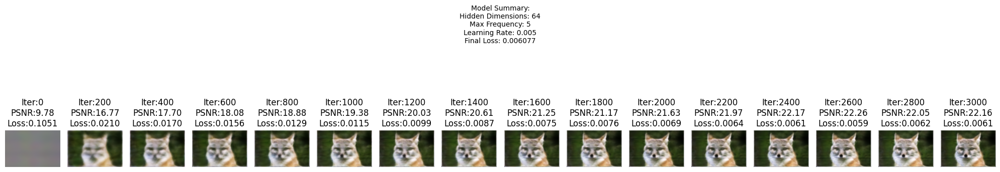

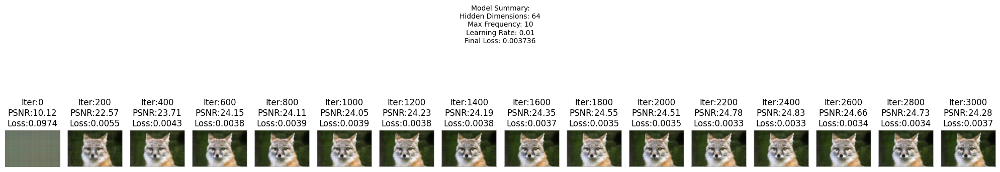

...

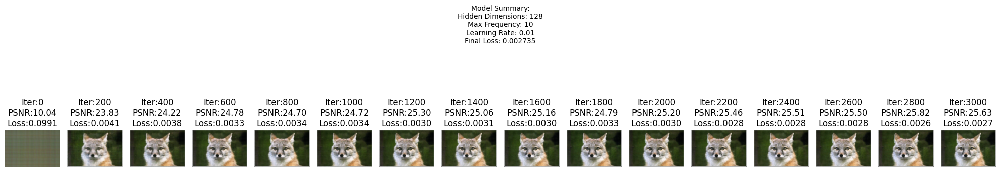

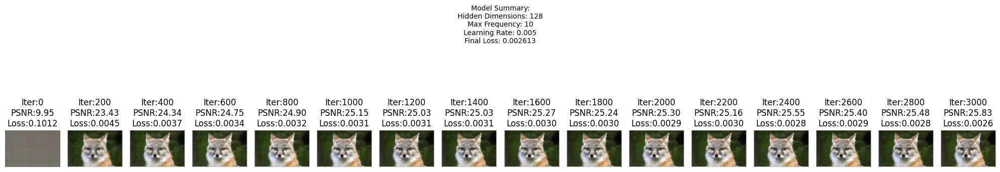

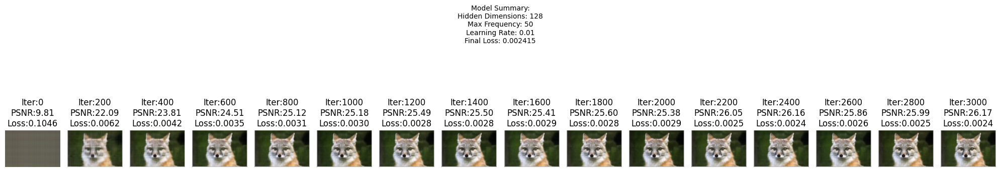

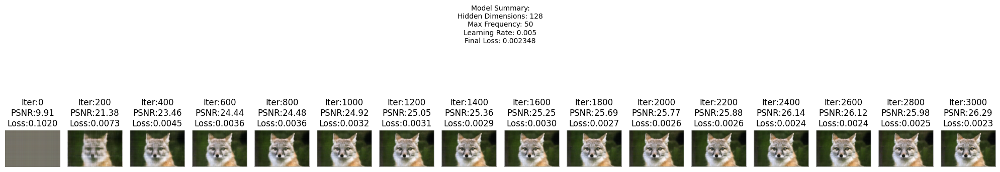

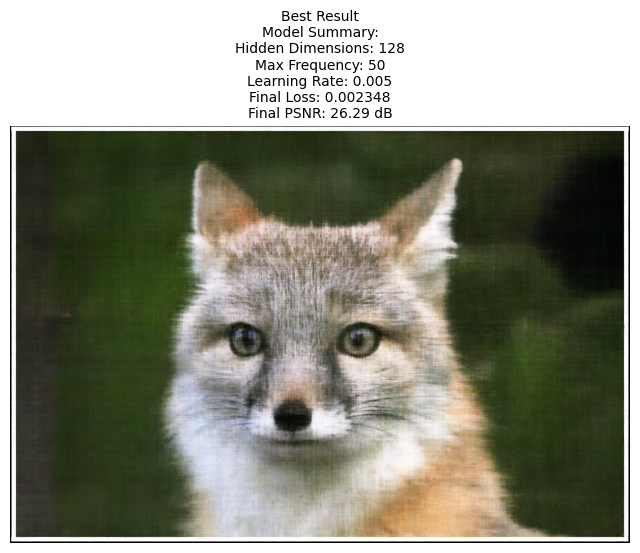

In [8]:
coords, colors, H, W, C = load_image("../images/1/1/1.jpg")

hidden_layer_options = [64, 128]
frequency_options = [5, 10, 50]
learning_rates = [1e-2, 5e-3]
batch_size = 10000
num_iterations = 3001

results = hyperparameter_tuning(coords, colors, H, W, C, hidden_layer_options, frequency_options, learning_rates, num_iterations, batch_size)
plot_hyperparameter_results(results)
visualize_reconstructed_images(results)
display_best_result(results)

#### image2

Training with HD:64, Freq:5, LR:0.01


HD:64, Freq:5, LR:0.01: 100%|█| 3001/3001 [00:05<00:00, 599.52iteration/s, Loss=


Training with HD:64, Freq:5, LR:0.005


HD:64, Freq:5, LR:0.005: 100%|█| 3001/3001 [00:05<00:00, 590.94iteration/s, Loss


Training with HD:64, Freq:10, LR:0.01


HD:64, Freq:10, LR:0.01: 100%|█| 3001/3001 [00:05<00:00, 511.10iteration/s, Loss


Training with HD:64, Freq:10, LR:0.005


HD:64, Freq:10, LR:0.005: 100%|█| 3001/3001 [00:05<00:00, 511.36iteration/s, Los


Training with HD:64, Freq:50, LR:0.01


HD:64, Freq:50, LR:0.01: 100%|█| 3001/3001 [00:11<00:00, 263.83iteration/s, Loss


Training with HD:64, Freq:50, LR:0.005


HD:64, Freq:50, LR:0.005: 100%|█| 3001/3001 [00:11<00:00, 261.30iteration/s, Los


Training with HD:128, Freq:5, LR:0.01


HD:128, Freq:5, LR:0.01: 100%|█| 3001/3001 [00:05<00:00, 576.65iteration/s, Loss


Training with HD:128, Freq:5, LR:0.005


HD:128, Freq:5, LR:0.005: 100%|█| 3001/3001 [00:04<00:00, 606.69iteration/s, Los


Training with HD:128, Freq:10, LR:0.01


HD:128, Freq:10, LR:0.01: 100%|█| 3001/3001 [00:05<00:00, 516.78iteration/s, Los


Training with HD:128, Freq:10, LR:0.005


HD:128, Freq:10, LR:0.005: 100%|█| 3001/3001 [00:05<00:00, 518.30iteration/s, Lo


Training with HD:128, Freq:50, LR:0.01


HD:128, Freq:50, LR:0.01: 100%|█| 3001/3001 [00:11<00:00, 260.36iteration/s, Los


Training with HD:128, Freq:50, LR:0.005


HD:128, Freq:50, LR:0.005: 100%|█| 3001/3001 [00:11<00:00, 261.37iteration/s, Lo


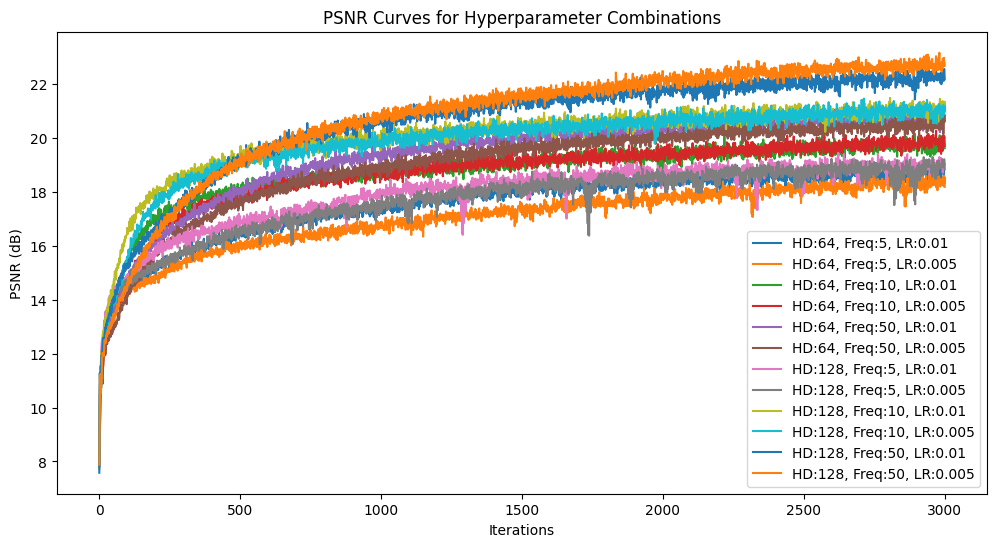

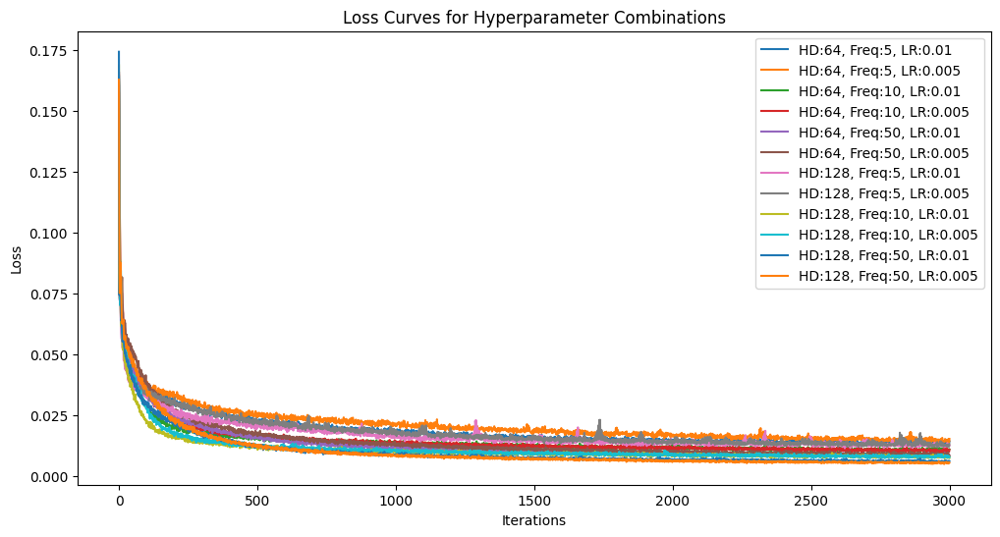

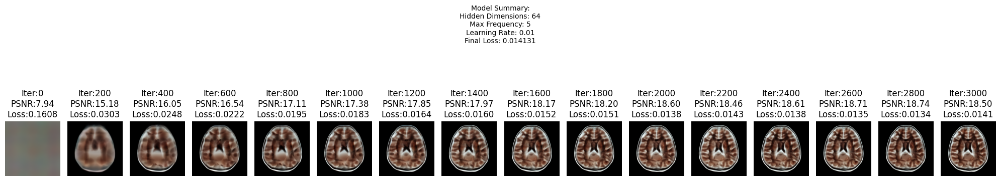

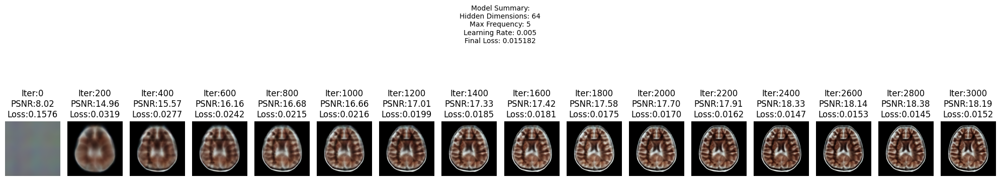

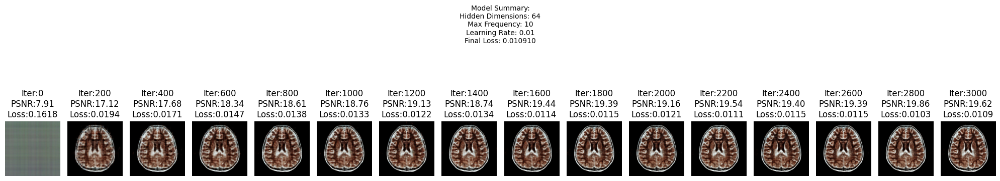

...

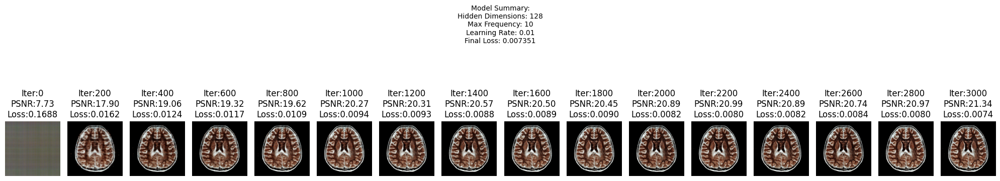

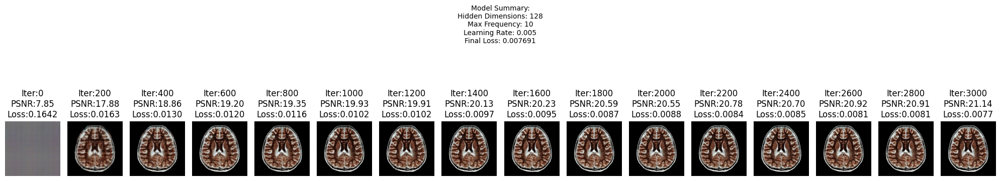

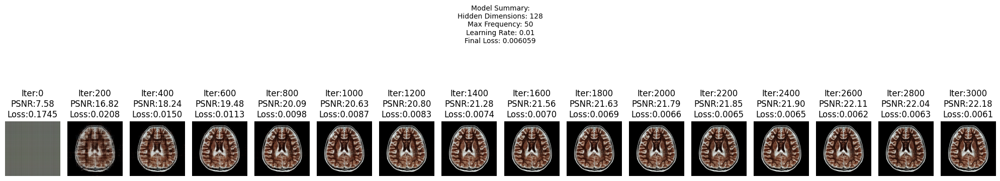

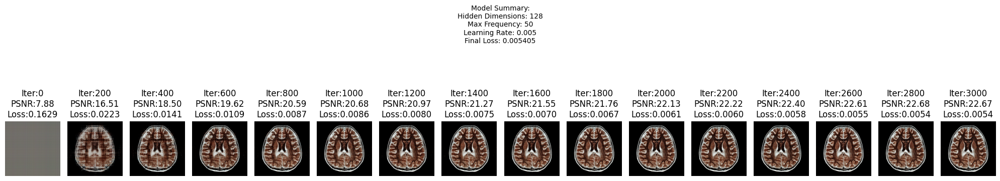

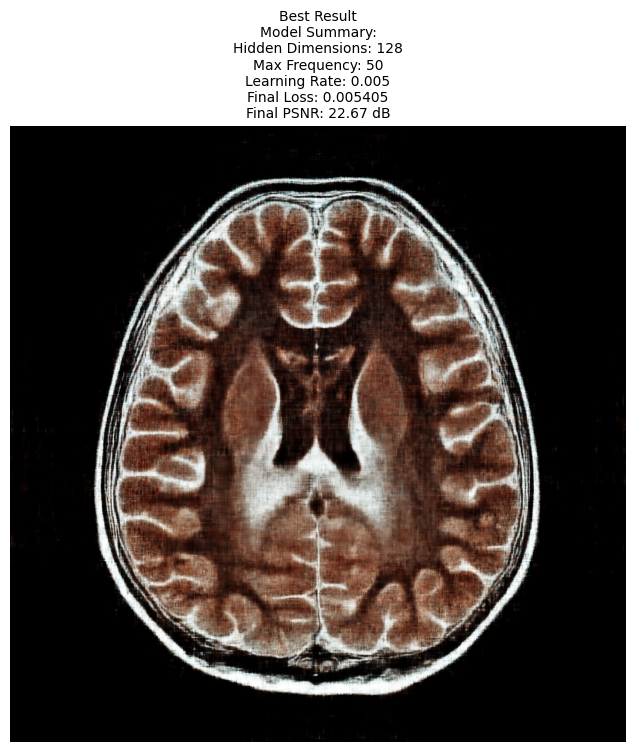

In [9]:
coords, colors, H, W, C = load_image("../images/1/2/1.jpg")

hidden_layer_options = [64, 128]
frequency_options = [5, 10, 50]
learning_rates = [1e-2, 5e-3]
batch_size = 10000
num_iterations = 3001

results = hyperparameter_tuning(coords, colors, H, W, C, hidden_layer_options, frequency_options, learning_rates, num_iterations, batch_size)
plot_hyperparameter_results(results)
visualize_reconstructed_images(results)
display_best_result(results)